In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q "/content/drive/MyDrive/Deep_Learning_Mini_Project/bdd100k_images_10k.zip" -d /content/bdd100k/
!unzip -q "/content/drive/MyDrive/Deep_Learning_Mini_Project/bdd100k_labels.zip" -d /content/bdd100k/

In [ ]:
# Check scene labels
import os
import json
from collections import Counter
from tqdm import tqdm

label_dir = "/content/bdd100k/100k/train"
scene_counter = Counter()

for file in tqdm(os.listdir(label_dir)):
    if not file.endswith(".json"):
        continue

    with open(os.path.join(label_dir, file), 'r') as f:
        data = json.load(f)
        scene = data.get("attributes", {}).get("scene")
        if scene:
            scene_counter[scene] += 1

# Display counts
print("\n Scene Type Distribution in /100k/train:")
for scene, count in scene_counter.items():
    print(f"{scene:<12}: {count} images")

100%|██████████| 70000/70000 [00:09<00:00, 7332.41it/s]


 Scene Type Distribution in /100k/train:
city street : 43581 images
highway     : 17414 images
residential : 8105 images
tunnel      : 129 images
undefined   : 366 images
parking lot : 378 images
gas stations: 27 images


In [ ]:
# Check timeofday labels
import os
import json
from collections import Counter
from tqdm import tqdm

label_dir = "/content/bdd100k/100k/train"
timeofday_counter = Counter()

for file in tqdm(os.listdir(label_dir)):
    if not file.endswith(".json"):
        continue

    with open(os.path.join(label_dir, file), 'r') as f:
        data = json.load(f)
        timeofday = data.get("attributes", {}).get("timeofday")
        if timeofday:
            timeofday_counter[timeofday] += 1

# Display counts
print("\nTimeofday Distribution in /100k/train:")
for timeofday, count in timeofday_counter.items():
    print(f"{timeofday:<12}: {count} images")

100%|██████████| 70000/70000 [00:09<00:00, 7274.56it/s]


Timeofday Distribution in /100k/train:
night       : 28028 images
daytime     : 36800 images
dawn/dusk   : 5033 images
undefined   : 139 images


In [ ]:
# Check weather labels
import os
import json
from collections import Counter
from tqdm import tqdm

label_dir = "/content/bdd100k/100k/train"
weather_counter = Counter()

for file in tqdm(os.listdir(label_dir)):
    if not file.endswith(".json"):
        continue

    with open(os.path.join(label_dir, file), 'r') as f:
        data = json.load(f)
        weather = data.get("attributes", {}).get("weather")
        if weather:
            weather_counter[weather] += 1

# Display counts
print("\nWeather Distribution in /100k/train:")
for weather, count in weather_counter.items():
    print(f"{weather:<12}: {count} images")

100%|██████████| 70000/70000 [00:10<00:00, 6991.29it/s]


Weather Distribution in /100k/train:
clear       : 37412 images
snowy       : 5571 images
partly cloudy: 4886 images
rainy       : 5083 images
overcast    : 8784 images
undefined   : 8134 images
foggy       : 130 images


In [ ]:
import os, json, shutil, csv
from tqdm import tqdm

# Paths
label_dirs = ["/content/bdd100k/100k/train", "/content/bdd100k/100k/val"]
image_dirs = ["/content/bdd100k/10k/train", "/content/bdd100k/10k/val"]
output_dir = "/content/bdd_filtered_all_labels"
os.makedirs(output_dir, exist_ok=True)

# Attribute mappings
scene_map = {
    "city street": 0,
    "residential": 1,
    "highway": 2,
    "tunnel": 3
}
time_map = {
    "daytime": 0,
    "night": 1,
    "dawn/dusk": 2
}
weather_map = {
    "clear": 0,
    "overcast": 1,
    "rainy": 2,
    "partly cloudy": 3,
    "snowy": 4,
    "foggy": 5
}

# Collect available images
available_images = {}
for img_dir in image_dirs:
    for fname in os.listdir(img_dir):
        if fname.endswith(".jpg"):
            available_images[fname] = os.path.join(img_dir, fname)

# Metadata CSV path
csv_path = os.path.join(output_dir, "metadata.csv")
csv_file = open(csv_path, mode="w", newline="")
csv_writer = csv.writer(csv_file)
csv_writer.writerow(["image_path", "scene_label", "timeofday_label", "weather_label"])

count = 0

# Process labels and create metadata.csv
for label_dir in label_dirs:
    for fname in tqdm(os.listdir(label_dir)):
        if not fname.endswith(".json"):
            continue

        json_path = os.path.join(label_dir, fname)
        with open(json_path, 'r') as f:
            data = json.load(f)

        attr = data.get("attributes", {})
        scene = scene_map.get(attr.get("scene"))
        time = time_map.get(attr.get("timeofday"))
        weather = weather_map.get(attr.get("weather"))

        if scene is None or time is None or weather is None:
            continue

        img_name = fname.replace(".json", ".jpg")
        src_path = available_images.get(img_name)
        if not src_path:
            continue

        # Copy to flat folder
        dst_path = os.path.join(output_dir, img_name)
        shutil.copy(src_path, dst_path)

        # Write to CSV
        csv_writer.writerow([dst_path, scene, time, weather])
        count += 1

csv_file.close()
print(f"\nMetadata written for {count} images to {csv_path}")

100%|██████████| 10000/10000 [00:01<00:00, 5135.17it/s]


Metadata written for 2804 images to /content/bdd_filtered_all_labels/metadata.csv


In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import torch
import csv

class MultiLabelBDD(Dataset):
    def __init__(self, csv_file, transform=None):
        self.samples = []
        self.transform = transform

        # Read metadata.csv
        with open(csv_file, 'r') as f:
            reader = csv.reader(f)
            next(reader)  # Skip header
            for row in reader:
                image_path, scene, time, weather = row
                self.samples.append((image_path, int(scene), int(time), int(weather)))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        image_path, scene, time, weather = self.samples[idx]
        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(scene), torch.tensor(time), torch.tensor(weather)

In [ ]:
from torchvision import transforms
from torch.utils.data import random_split, DataLoader

# Define transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Initialize dataset
csv_path = "/content/bdd_filtered_all_labels/metadata.csv"
dataset = MultiLabelBDD(csv_path, transform=transform)

# Split train/val/test
total_size = len(dataset)
train_size = int(0.8 * total_size)
val_size = int(0.1 * total_size)
test_size = total_size - train_size - val_size

train_ds, val_ds, test_ds = random_split(dataset, [train_size, val_size, test_size])

# Create DataLoaders
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=32)
test_loader = DataLoader(test_ds, batch_size=32)

In [ ]:
# Defining Multi-Task ResNet18 + Optimizer

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Detect device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Load pretrained ResNet18
base_model = models.resnet18(pretrained=True)

class MultiTaskResNet(nn.Module):
    def __init__(self, base_model, num_scene, num_time, num_weather):
        super(MultiTaskResNet, self).__init__()
        self.shared = nn.Sequential(*list(base_model.children())[:-1])  # All layers except final FC
        in_features = base_model.fc.in_features

        self.scene_head = nn.Linear(in_features, num_scene)
        self.time_head = nn.Linear(in_features, num_time)
        self.weather_head = nn.Linear(in_features, num_weather)

    def forward(self, x):
        x = self.shared(x)
        x = x.view(x.size(0), -1)

        scene_out = self.scene_head(x)
        time_out = self.time_head(x)
        weather_out = self.weather_head(x)
        return scene_out, time_out, weather_out

# Define model
model = MultiTaskResNet(base_model, num_scene=4, num_time=3, num_weather=6)
model = model.to(device)

# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0003)

Using device: cuda


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 188MB/s]


In [ ]:
# Training Loop for Multi-Output Model

def train_model(model, train_loader, val_loader, epochs=10):
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        correct_s, correct_t, correct_w, total = 0, 0, 0, 0
        # Note: correct_s = Count of correct predictions for scene label during training/val
        # correct_t = Count of correct predictions for time of day label
        # correct_w = Count of correct predictions for weather label
        # total = Total number of samples processed in that epoch (same across all tasks)

        for images, scene_labels, time_labels, weather_labels in train_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            optimizer.zero_grad()
            out_scene, out_time, out_weather = model(images)

            loss_scene = criterion(out_scene, scene_labels)
            loss_time = criterion(out_time, time_labels)
            loss_weather = criterion(out_weather, weather_labels)

            loss = loss_scene + loss_time + loss_weather
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)
            correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
            correct_t += (out_time.argmax(1) == time_labels).sum().item()
            correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
            total += images.size(0)

        # Train metrics
        train_acc_s = 100 * correct_s / total
        train_acc_t = 100 * correct_t / total
        train_acc_w = 100 * correct_w / total
        avg_train_loss = train_loss / total

        # Validation
        model.eval()
        val_loss = 0.0
        correct_s, correct_t, correct_w, total = 0, 0, 0, 0

        with torch.no_grad():
            for images, scene_labels, time_labels, weather_labels in val_loader:
                images = images.to(device)
                scene_labels = scene_labels.to(device)
                time_labels = time_labels.to(device)
                weather_labels = weather_labels.to(device)

                out_scene, out_time, out_weather = model(images)

                loss_scene = criterion(out_scene, scene_labels)
                loss_time = criterion(out_time, time_labels)
                loss_weather = criterion(out_weather, weather_labels)

                loss = loss_scene + loss_time + loss_weather
                val_loss += loss.item() * images.size(0)

                correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
                correct_t += (out_time.argmax(1) == time_labels).sum().item()
                correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
                total += images.size(0)

        val_acc_s = 100 * correct_s / total
        val_acc_t = 100 * correct_t / total
        val_acc_w = 100 * correct_w / total
        avg_val_loss = val_loss / total

        print(f"[Epoch {epoch+1}] Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        print(f"            Scene Acc: {train_acc_s:.2f}% → {val_acc_s:.2f}%, "
              f"Time Acc: {train_acc_t:.2f}% → {val_acc_t:.2f}%, "
              f"Weather Acc: {train_acc_w:.2f}% → {val_acc_w:.2f}%")

    print("Training complete.")

In [ ]:
# Train the multi-task model
train_model(model, train_loader, val_loader, epochs=10)

[Epoch 1] Loss: 2.1164, Val Loss: 2.0057
            Scene Acc: 66.74% → 67.86%, Time Acc: 85.20% → 89.29%, Weather Acc: 64.24% → 68.21%
[Epoch 2] Loss: 0.9852, Val Loss: 2.0378
            Scene Acc: 84.13% → 71.79%, Time Acc: 94.43% → 87.86%, Weather Acc: 84.62% → 71.07%
[Epoch 3] Loss: 0.4231, Val Loss: 2.0697
            Scene Acc: 94.83% → 72.14%, Time Acc: 98.08% → 87.86%, Weather Acc: 94.74% → 73.21%
[Epoch 4] Loss: 0.2898, Val Loss: 1.9774
            Scene Acc: 96.66% → 75.00%, Time Acc: 98.13% → 90.71%, Weather Acc: 97.46% → 71.79%
[Epoch 5] Loss: 0.1617, Val Loss: 2.1309
            Scene Acc: 97.55% → 72.14%, Time Acc: 99.64% → 91.07%, Weather Acc: 98.71% → 69.29%
[Epoch 6] Loss: 0.1636, Val Loss: 2.3815
            Scene Acc: 98.53% → 73.57%, Time Acc: 99.60% → 89.64%, Weather Acc: 97.37% → 71.07%
[Epoch 7] Loss: 0.2134, Val Loss: 2.1759
            Scene Acc: 98.08% → 68.21%, Time Acc: 99.42% → 87.50%, Weather Acc: 96.17% → 76.79%
[Epoch 8] Loss: 0.1345, Val Loss: 2.8160


In [ ]:
# Evaluating on Test Set (Scene, Time, Weather)

def evaluate_model(model, test_loader):
    model.eval()
    correct_s = correct_t = correct_w = 0
    total = 0

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in test_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            out_scene, out_time, out_weather = model(images)

            correct_s += (out_scene.argmax(1) == scene_labels).sum().item()
            correct_t += (out_time.argmax(1) == time_labels).sum().item()
            correct_w += (out_weather.argmax(1) == weather_labels).sum().item()
            total += images.size(0)

    print(f"Test Accuracy → Scene: {100 * correct_s / total:.2f}%, "
          f"Time: {100 * correct_t / total:.2f}%, "
          f"Weather: {100 * correct_w / total:.2f}%")

In [ ]:
# Evaluate performance on test set
evaluate_model(model, test_loader)

Test Accuracy → Scene: 73.67%, Time: 91.46%, Weather: 78.29%


In [ ]:
# Visualizing Predictions from Test Set

import matplotlib.pyplot as plt
import numpy as np

# Index-to-class mappings
scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
weather_idx_to_class = {0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"}

def show_predictions(model, loader, num_images=6):
    model.eval()
    shown = 0
    plt.figure(figsize=(18, 10))

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            out_scene, out_time, out_weather = model(images)
            preds_s = out_scene.argmax(1)
            preds_t = out_time.argmax(1)
            preds_w = out_weather.argmax(1)

            for i in range(images.size(0)):
                if shown >= num_images:
                    break

                img = images[i].cpu().permute(1, 2, 0).numpy()
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # unnormalize
                img = np.clip(img, 0, 1)

                true_scene = scene_idx_to_class[scene_labels[i].item()]
                pred_scene = scene_idx_to_class[preds_s[i].item()]

                true_time = time_idx_to_class[time_labels[i].item()]
                pred_time = time_idx_to_class[preds_t[i].item()]

                true_weather = weather_idx_to_class[weather_labels[i].item()]
                pred_weather = weather_idx_to_class[preds_w[i].item()]

                title = (f"Scene: {pred_scene} ({'Correct' if pred_scene == true_scene else 'Incorrect'})\n"
                         f"Time: {pred_time} ({'Correct' if pred_time == true_time else 'Incorrect'})\n"
                         f"Weather: {pred_weather} ({'Correct' if pred_weather == true_weather else 'Incorrect'})")

                plt.subplot(2, 3, shown + 1)
                plt.imshow(img)
                plt.title(title, fontsize=10)
                plt.axis('off')

                shown += 1
            if shown >= num_images:
                break

    plt.tight_layout()
    plt.show()

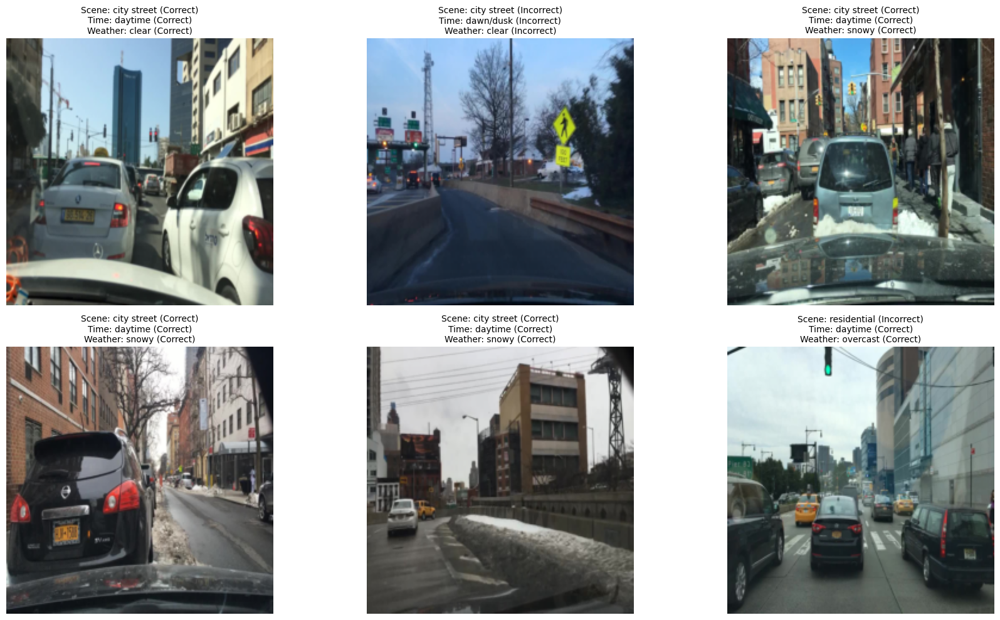

In [ ]:
# Show a few visual predictions
show_predictions(model, test_loader, num_images=6)

In [ ]:
# Implementing Grad-CAM Hooks for Multi-Output Model

gradients = None
activations = None

def save_gradient_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

def save_activation_hook(module, input, output):
    global activations
    activations = output

# ✅ Hook into final ResNet block before global avg pooling
target_layer = model.shared[7]
target_layer.register_forward_hook(save_activation_hook)
target_layer.register_backward_hook(save_gradient_hook)

In [ ]:
# Preprocess a single image (from test set path)
def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])
    return transform(img).unsqueeze(0).to(device), img

In [ ]:
# Generating Grad-CAM (Multi-Task)

def generate_gradcam(image_tensor, class_idx, target_head="scene"):
    model.eval()

    # Forward pass
    scene_out, time_out, weather_out = model(image_tensor)

    # Select correct output head
    if target_head == "scene":
        target = scene_out
    elif target_head == "time":
        target = time_out
    elif target_head == "weather":
        target = weather_out
    else:
        raise ValueError("target_head must be one of: 'scene', 'time', 'weather'")

    # Backward pass on selected class
    model.zero_grad()
    one_hot = torch.zeros_like(target)
    one_hot[0][class_idx] = 1
    target.backward(gradient=one_hot)

    # Grad-CAM logic
    pooled_grad = torch.mean(gradients, dim=[0, 2, 3])
    act = activations[0]
    for i in range(act.shape[0]):
        act[i, :, :] *= pooled_grad[i]

    heatmap = act.mean(dim=0).cpu().detach().numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-8

    return heatmap

In [ ]:
# Overlay + Display

import cv2

def show_gradcam(image_path, class_idx, class_name, target_head="scene"):
    image_tensor, orig_img = preprocess_image(image_path)
    heatmap = generate_gradcam(image_tensor, class_idx, target_head)

    # Resize + overlay
    heatmap = cv2.resize(heatmap, (orig_img.width, orig_img.height))
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    orig_np = np.array(orig_img)
    overlay = cv2.addWeighted(orig_np, 0.6, heatmap_color, 0.4, 0)

    # Plot
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(orig_img)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title(f"Overlay (Pred: {class_name}) [{target_head}]")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
# Show Grad-CAM for predicted labels automatically

def run_gradcam_on_prediction(image_path):
    # Preprocess
    image_tensor, _ = preprocess_image(image_path)

    # Forward pass
    scene_out, time_out, weather_out = model(image_tensor)

    # Get predicted indices
    scene_idx = scene_out.argmax(1).item()
    time_idx = time_out.argmax(1).item()
    weather_idx = weather_out.argmax(1).item()

    # Label mappings
    scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
    time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
    weather_idx_to_class = {
        0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"
    }

    # Display predictions (optional)
    print(f"Predicted Scene   → {scene_idx_to_class[scene_idx]} ({scene_idx})")
    print(f"Predicted Time    → {time_idx_to_class[time_idx]} ({time_idx})")
    print(f"Predicted Weather → {weather_idx_to_class[weather_idx]} ({weather_idx})")

    # Run Grad-CAMs
    show_gradcam(image_path, class_idx=scene_idx,
                 class_name=scene_idx_to_class[scene_idx], target_head="scene")

    show_gradcam(image_path, class_idx=time_idx,
                 class_name=time_idx_to_class[time_idx], target_head="time")

    show_gradcam(image_path, class_idx=weather_idx,
                 class_name=weather_idx_to_class[weather_idx], target_head="weather")

Predicted Scene   → city street (0)
Predicted Time    → dawn/dusk (2)
Predicted Weather → snowy (4)


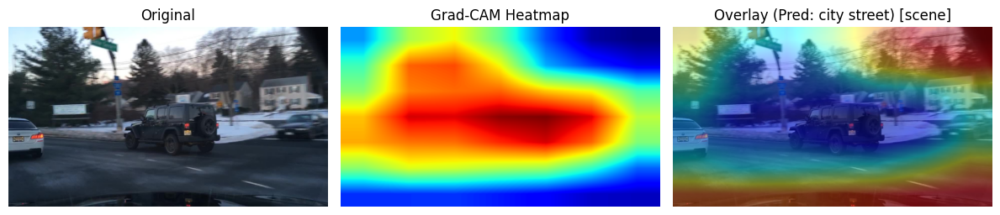

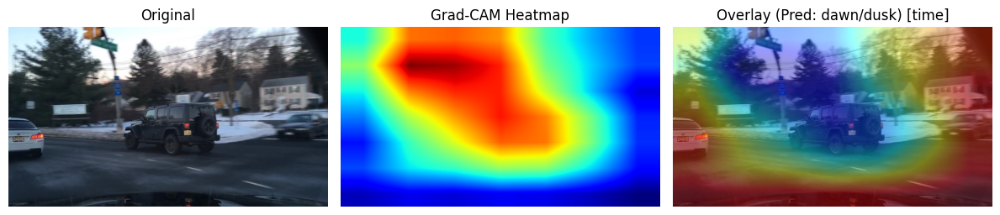

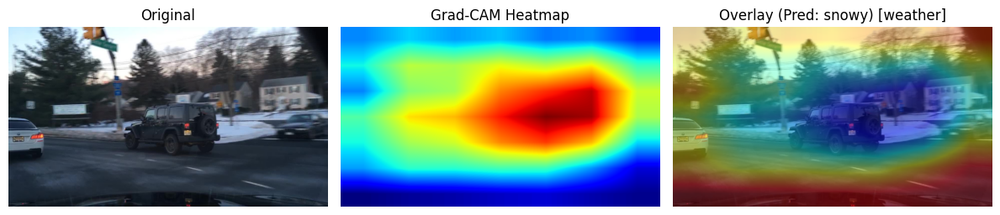

In [ ]:
image_path = "/content/bdd_filtered_all_labels/0ac3cbf4-73c76d25.jpg"
run_gradcam_on_prediction(image_path)

Predicted Scene   → residential (1)
Predicted Time    → daytime (0)
Predicted Weather → clear (0)


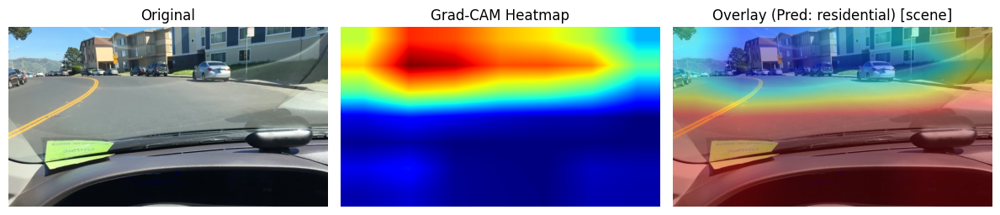

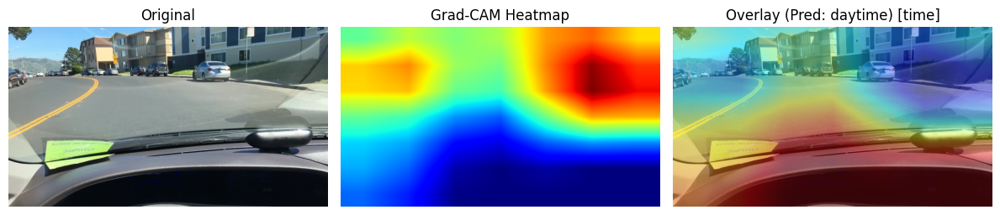

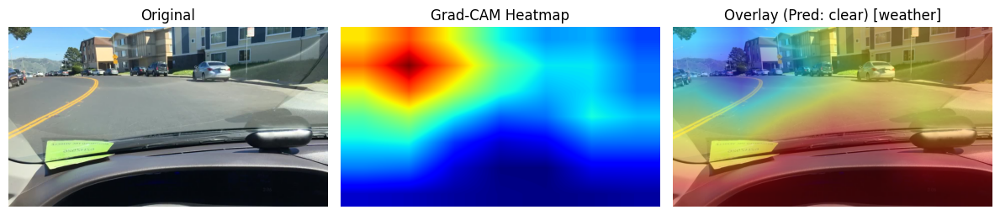

In [ ]:
image_path = "/content/bdd_filtered_all_labels/0cdde16a-e2d9677e.jpg"
run_gradcam_on_prediction(image_path)

Predicted Scene   → city street (0)
Predicted Time    → daytime (0)
Predicted Weather → rainy (2)


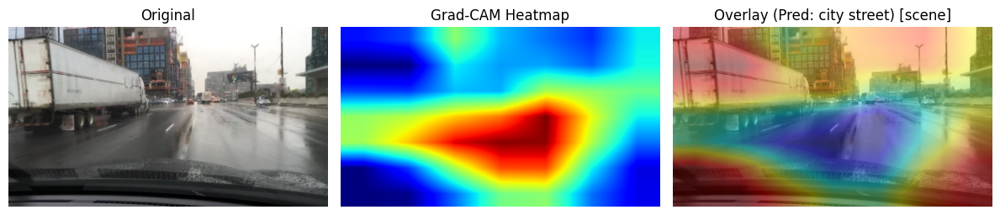

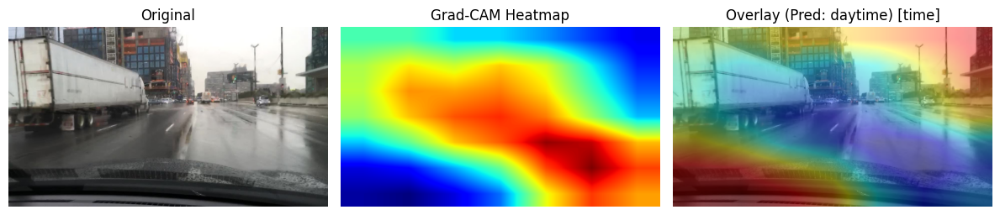

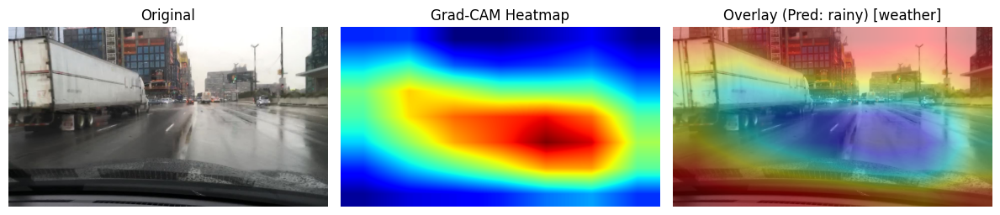

In [ ]:
image_path = "/content/bdd_filtered_all_labels/1a07eecb-5d4efd09.jpg"
run_gradcam_on_prediction(image_path)

In [ ]:
# Collecting multiple wrong predicted sample

def get_multiple_wrong_predictions(n=5):
    model.eval()
    collected = []

    with torch.no_grad():
        for images, scene_labels, time_labels, weather_labels in test_loader:
            images = images.to(device)
            scene_labels = scene_labels.to(device)
            time_labels = time_labels.to(device)
            weather_labels = weather_labels.to(device)

            scene_out, time_out, weather_out = model(images)
            scene_preds = scene_out.argmax(1)
            time_preds = time_out.argmax(1)
            weather_preds = weather_out.argmax(1)

            for i in range(len(images)):
                if (scene_preds[i] != scene_labels[i] or
                    time_preds[i] != time_labels[i] or
                    weather_preds[i] != weather_labels[i]):

                    img_tensor = images[i].cpu()
                    img_np = img_tensor.permute(1, 2, 0).numpy()
                    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                    img_np = np.clip(img_np, 0, 1)

                    # Store in-memory object
                    collected.append({
                        "image_np": img_np,
                        "scene_pred": scene_preds[i].item(),
                        "scene_true": scene_labels[i].item(),
                        "time_pred": time_preds[i].item(),
                        "time_true": time_labels[i].item(),
                        "weather_pred": weather_preds[i].item(),
                        "weather_true": weather_labels[i].item()
                    })

                    if len(collected) >= n:
                        return collected

    return collected

In [ ]:
# Visualizing Grad-CAM for All Wrong Samples

def visualize_wrong_gradcams(wrong_samples):
    # Label maps
    scene_idx_to_class = {0: "city street", 1: "residential", 2: "highway", 3: "tunnel"}
    time_idx_to_class = {0: "daytime", 1: "night", 2: "dawn/dusk"}
    weather_idx_to_class = {
        0: "clear", 1: "overcast", 2: "rainy", 3: "partly cloudy", 4: "snowy", 5: "foggy"
    }

    for idx, sample in enumerate(wrong_samples):
        print(f"\n==== Sample {idx + 1} ====")

        # Save image temporarily to use Grad-CAM
        temp_path = f"misclassified_{idx}.jpg"
        Image.fromarray((sample["image_np"] * 255).astype(np.uint8)).save(temp_path)

        # Display predictions
        for head, pred_idx, true_idx, class_map in [
            ("scene", sample["scene_pred"], sample["scene_true"], scene_idx_to_class),
            ("time", sample["time_pred"], sample["time_true"], time_idx_to_class),
            ("weather", sample["weather_pred"], sample["weather_true"], weather_idx_to_class),
        ]:
            pred_label = class_map[pred_idx]
            true_label = class_map[true_idx]
            correctness = "Correct" if pred_idx == true_idx else "Wrong"
            print(f"{head.capitalize():<8}: Pred = {pred_label} ({pred_idx}), True = {true_label} ({true_idx}) → {correctness}")

            # Grad-CAM overlay
            show_gradcam(temp_path, class_idx=pred_idx, class_name=f"{pred_label} (pred)", target_head=head)

In [ ]:
# Get multiple wrong predictions
wrong_samples = get_multiple_wrong_predictions(n=5)


==== Sample 1 ====
Scene   : Pred = city street (0), True = highway (2) → Wrong


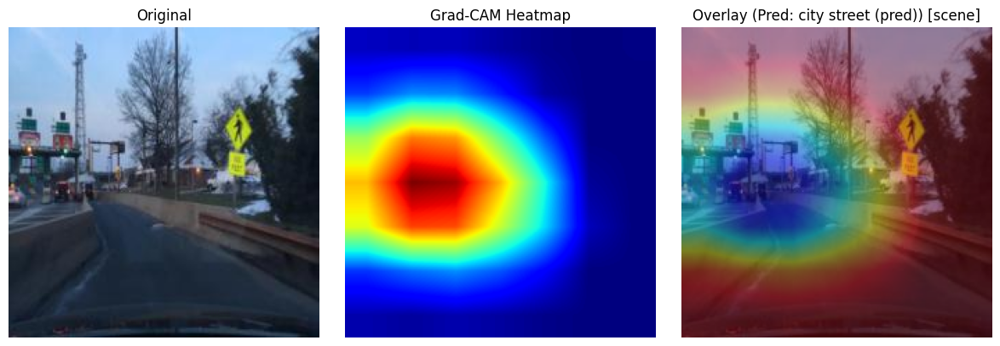

Time    : Pred = dawn/dusk (2), True = daytime (0) → Wrong


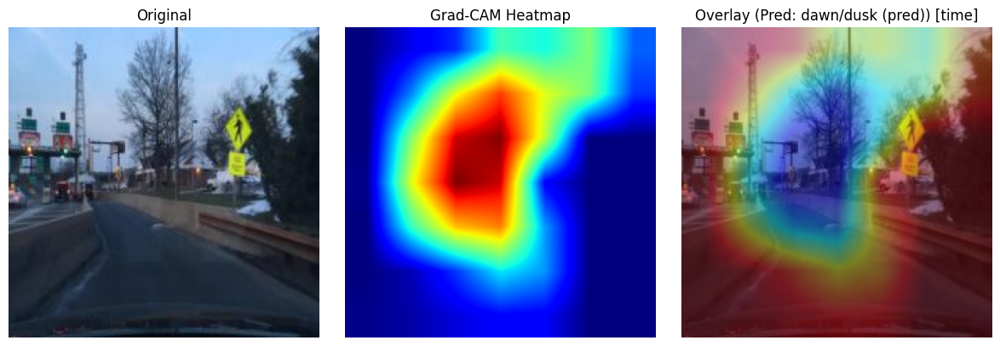

Weather : Pred = clear (0), True = snowy (4) → Wrong


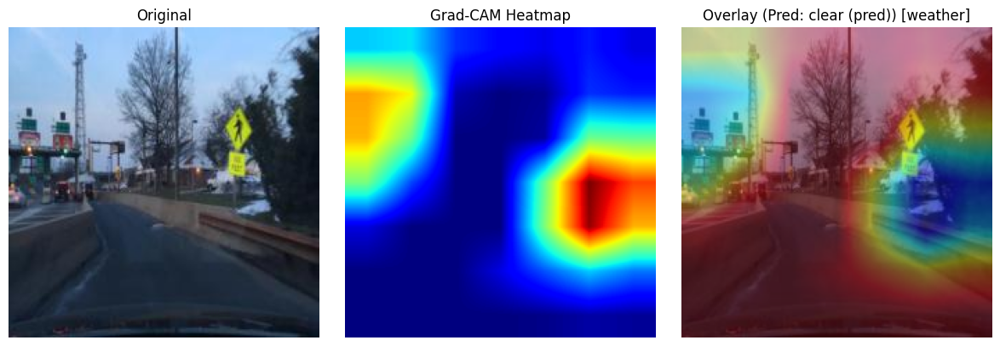


==== Sample 2 ====
Scene   : Pred = residential (1), True = city street (0) → Wrong


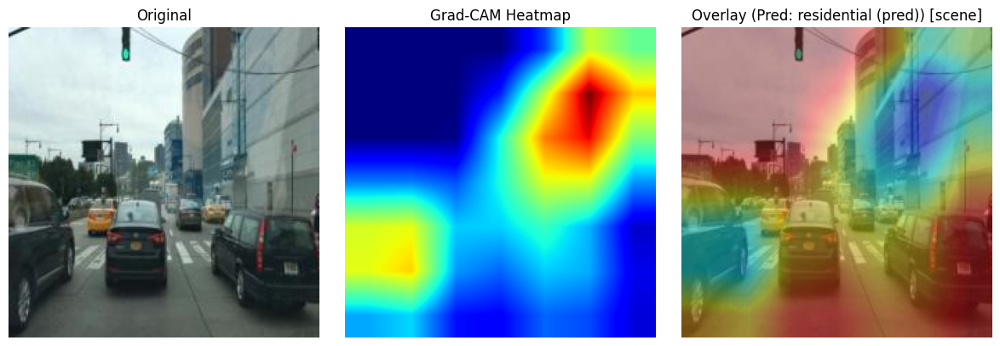

Time    : Pred = daytime (0), True = daytime (0) → Correct


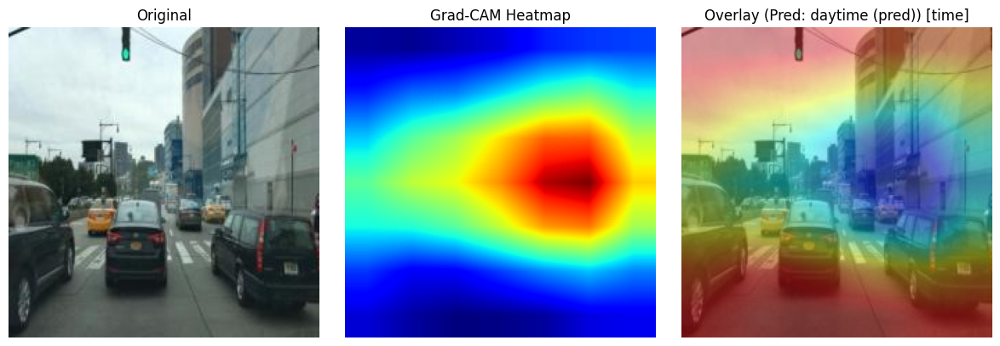

Weather : Pred = overcast (1), True = overcast (1) → Correct


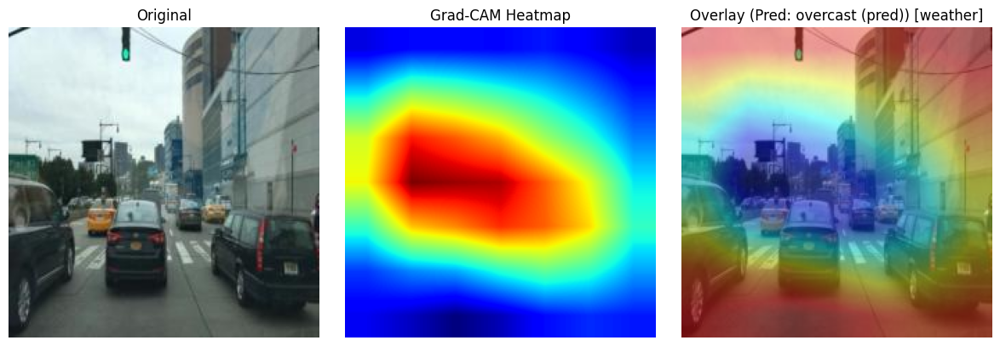


==== Sample 3 ====
Scene   : Pred = city street (0), True = city street (0) → Correct


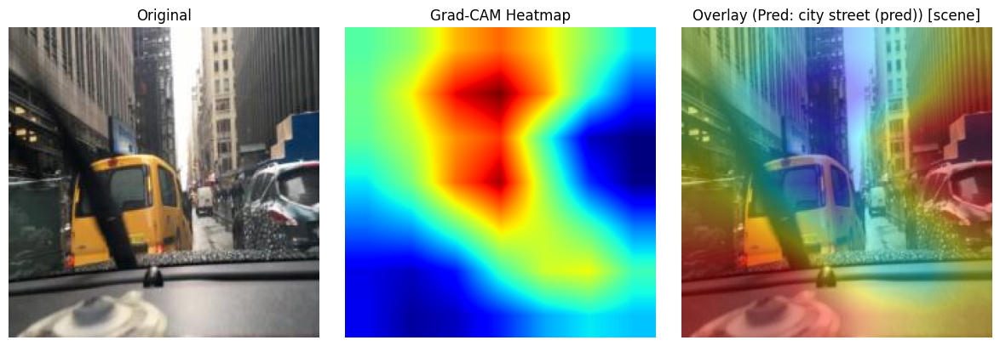

Time    : Pred = daytime (0), True = daytime (0) → Correct


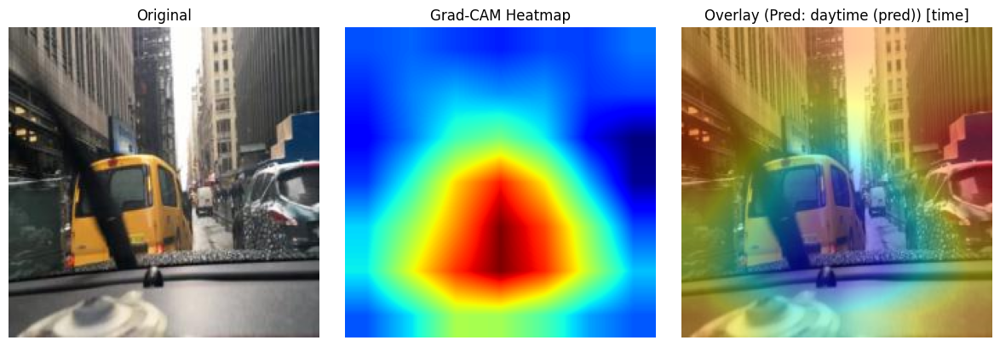

Weather : Pred = snowy (4), True = rainy (2) → Wrong


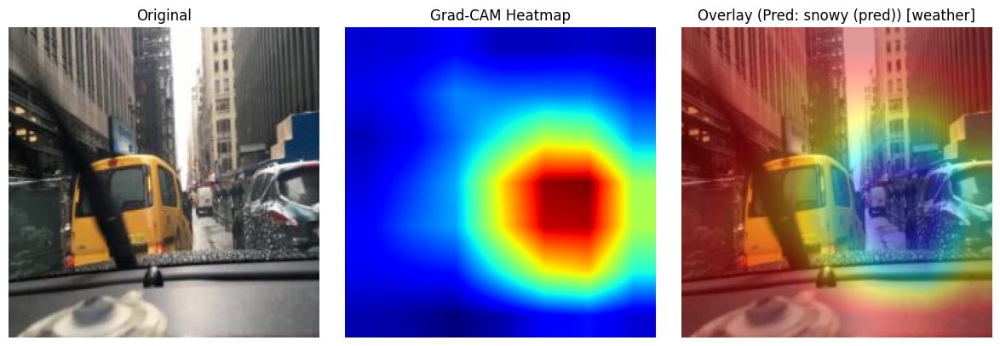


==== Sample 4 ====
Scene   : Pred = city street (0), True = city street (0) → Correct


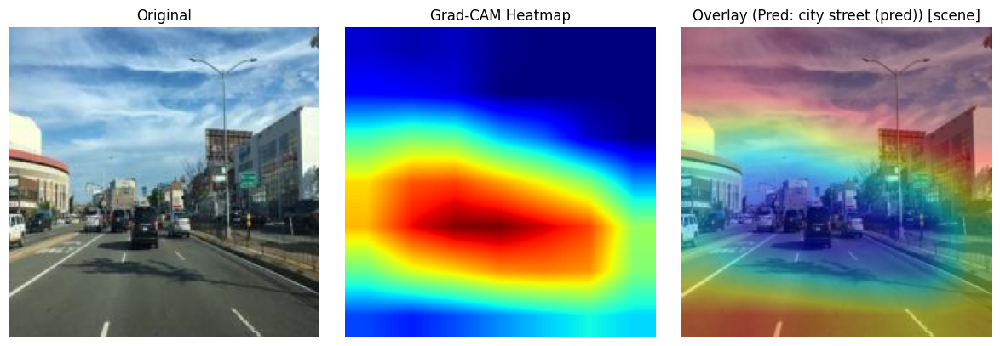

Time    : Pred = daytime (0), True = daytime (0) → Correct


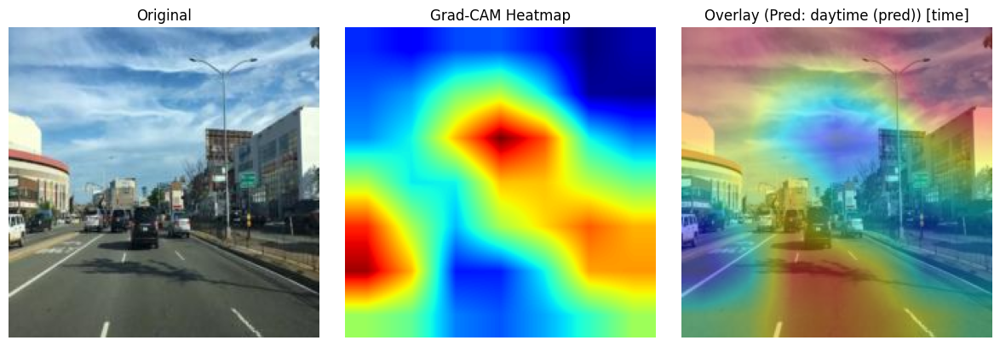

Weather : Pred = overcast (1), True = partly cloudy (3) → Wrong


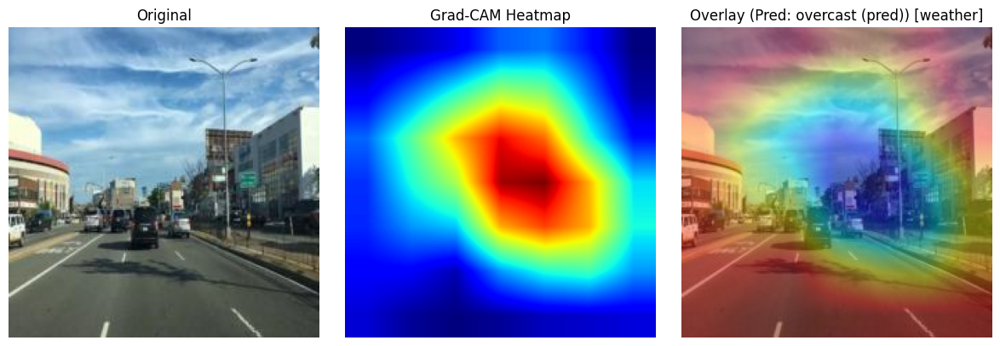


==== Sample 5 ====
Scene   : Pred = highway (2), True = city street (0) → Wrong


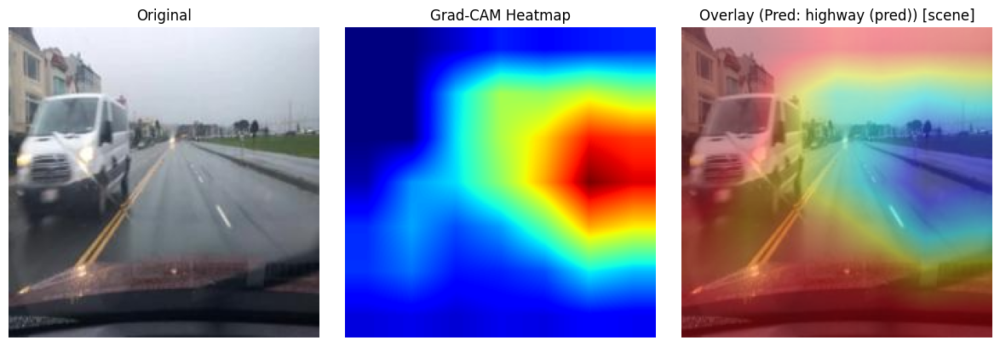

Time    : Pred = daytime (0), True = daytime (0) → Correct


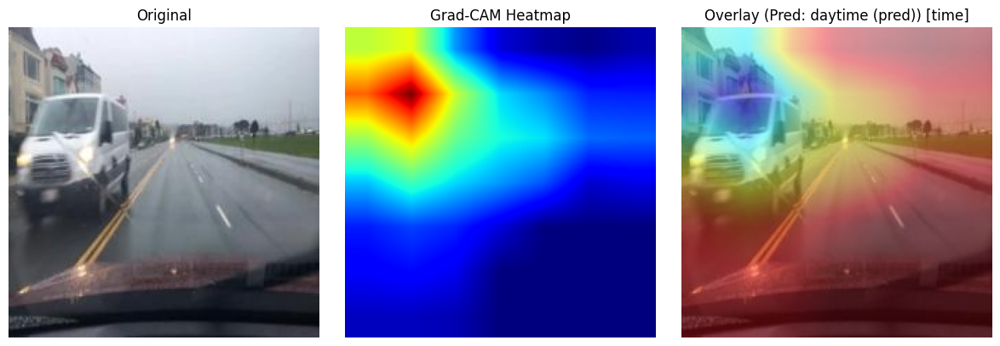

Weather : Pred = rainy (2), True = rainy (2) → Correct


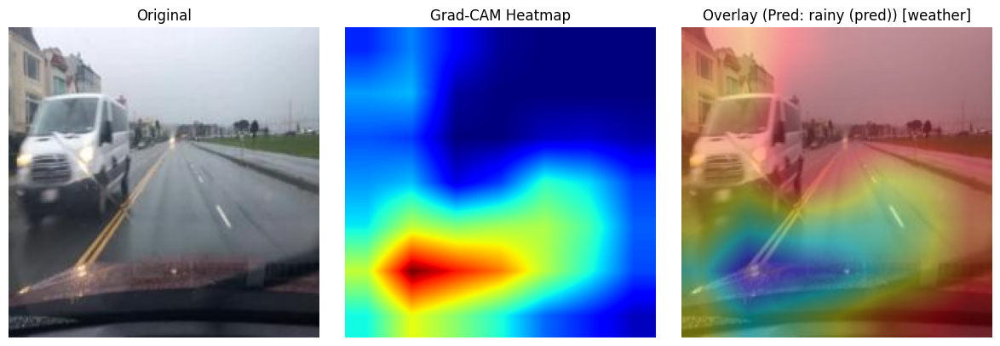

In [ ]:
# Visualize them
visualize_wrong_gradcams(wrong_samples)